In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap

In [2]:
sns.set(rc={'figure.figsize':(11.7,8.27)})

In [4]:
df_1 = pd.read_csv('datasets/data.csv', chunksize=1000000)
df = pd.concat(df_1)

In [5]:
df.head(5)

,trip_id,year,month,week,day,hour,usertype,gender,starttime,stoptime,...,from_station_id,from_station_name,latitude_start,longitude_start,dpcapacity_start,to_station_id,to_station_name,latitude_end,longitude_end,dpcapacity_end
0,2355134,2014,6,27,0,23,Subscriber,Male,2014-06-30 23:57:00,2014-07-01 00:07:00,...,131,Lincoln Ave & Belmont Ave,41.939365,-87.668385,15.0,303,Broadway & Cornelia Ave,41.945512,-87.645980,15.0
1,2355133,2014,6,27,0,23,Subscriber,Male,2014-06-30 23:56:00,2014-07-01 00:00:00,...,282,Halsted St & Maxwell St,41.864580,-87.646930,15.0,22,May St & Taylor St,41.869482,-87.655486,15.0
2,2355130,2014,6,27,0,23,Subscriber,Male,2014-06-30 23:33:00,2014-06-30 23:35:00,...,327,Sheffield Ave & Webster Ave,41.921687,-87.653714,19.0,225,Halsted St & Dickens Ave,41.919936,-87.648830,15.0
3,2355129,2014,6,27,0,23,Subscriber,Female,2014-06-30 23:26:00,2014-07-01 00:24:00,...,134,Peoria St & Jackson Blvd,41.877749,-87.649633,19.0,194,State St & Wacker Dr,41.887155,-87.627750,11.0
4,2355128,2014,6,27,0,23,Subscriber,Female,2014-06-30 23:16:00,2014-06-30 23:26:00,...,320,Loomis St & Lexington St,41.872187,-87.661501,15.0,134,Peoria St & Jackson Blvd,41.877749,-87.649633,19.0


In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
trip_id,9495235.0,9.861173e+06,4.680018e+06,1.109427e+06,5.941660e+06,1.005810e+07,1.383260e+07,1.753670e+07
year,9495235.0,2.015737e+03,1.075629e+00,2.014000e+03,2.015000e+03,2.016000e+03,2.017000e+03,2.017000e+03
month,9495235.0,7.161242e+00,2.708379e+00,1.000000e+00,5.000000e+00,7.000000e+00,9.000000e+00,1.200000e+01
week,9495235.0,2.938068e+01,1.177941e+01,1.000000e+00,2.100000e+01,3.000000e+01,3.800000e+01,5.300000e+01
day,9495235.0,2.687387e+00,1.890345e+00,0.000000e+00,1.000000e+00,3.000000e+00,4.000000e+00,6.000000e+00
hour,9495235.0,1.362471e+01,4.858830e+00,0.000000e+00,9.000000e+00,1.500000e+01,1.700000e+01,2.300000e+01
tripduration,9495235.0,1.144686e+01,7.206061e+00,2.000000e+00,6.033333e+00,9.633333e+00,1.520000e+01,6.000000e+01
temperature,9495235.0,6.299990e+01,1.720086e+01,-1.500000e+01,5.200000e+01,6.690000e+01,7.590000e+01,9.500000e+01
from_station_id,9495235.0,1.799215e+02,1.217041e+02,2.000000e+00,7.700000e+01,1.640000e+02,2.680000e+02,6.260000e+02
latitude_start,9495235.0,4.190017e+01,3.467450e-02,4.173665e+01,4.188103e+01,4.189228e+01,4.192008e+01,4.206431e+01


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9495235 entries, 0 to 9495234
Data columns (total 23 columns):
 #   Column             Dtype  
---  ------             -----  
 0   trip_id            int64  
 1   year               int64  
 2   month              int64  
 3   week               int64  
 4   day                int64  
 5   hour               int64  
 6   usertype           object 
 7   gender             object 
 8   starttime          object 
 9   stoptime           object 
 10  tripduration       float64
 11  temperature        float64
 12  events             object 
 13  from_station_id    int64  
 14  from_station_name  object 
 15  latitude_start     float64
 16  longitude_start    float64
 17  dpcapacity_start   float64
 18  to_station_id      int64  
 19  to_station_name    object 
 20  latitude_end       float64
 21  longitude_end      float64
 22  dpcapacity_end     float64
dtypes: float64(8), int64(8), object(7)
memory usage: 1.6+ GB


In [8]:
df.usertype.unique()

array(['Subscriber', 'Customer', 'Dependent'], dtype=object)

In [9]:
df['starttime']=pd.to_datetime(df['starttime'], format="%Y-%m-%d %H:%M:%S")
df['stoptime']=pd.to_datetime(df['stoptime'], format="%Y-%m-%d %H:%M:%S")

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9495235 entries, 0 to 9495234
Data columns (total 23 columns):
 #   Column             Dtype         
---  ------             -----         
 0   trip_id            int64         
 1   year               int64         
 2   month              int64         
 3   week               int64         
 4   day                int64         
 5   hour               int64         
 6   usertype           object        
 7   gender             object        
 8   starttime          datetime64[ns]
 9   stoptime           datetime64[ns]
 10  tripduration       float64       
 11  temperature        float64       
 12  events             object        
 13  from_station_id    int64         
 14  from_station_name  object        
 15  latitude_start     float64       
 16  longitude_start    float64       
 17  dpcapacity_start   float64       
 18  to_station_id      int64         
 19  to_station_name    object        
 20  latitude_end       float

In [11]:
df.isnull().sum()

trip_id              0
year                 0
month                0
week                 0
day                  0
hour                 0
usertype             0
gender               0
starttime            0
stoptime             0
tripduration         0
temperature          0
events               0
from_station_id      0
from_station_name    0
latitude_start       0
longitude_start      0
dpcapacity_start     0
to_station_id        0
to_station_name      0
latitude_end         0
longitude_end        0
dpcapacity_end       0
dtype: int64

## EDA

<AxesSubplot:xlabel='usertype', ylabel='Count'>

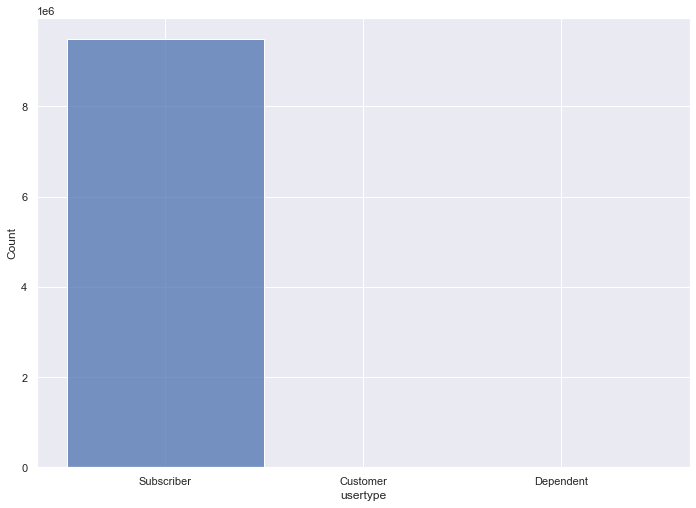

In [12]:
sns.histplot(df, x='usertype')

In [13]:
df.usertype.value_counts()

Subscriber    9493780
Customer         1277
Dependent         178
Name: usertype, dtype: int64

<AxesSubplot:xlabel='gender', ylabel='Count'>

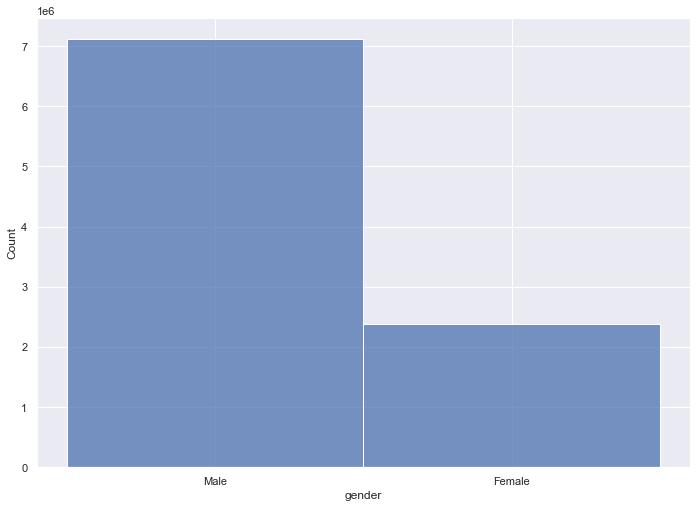

In [14]:
sns.histplot(df, x='gender')

In [15]:
df.gender.value_counts()

Male      7116560
Female    2378675
Name: gender, dtype: int64

<AxesSubplot:xlabel='year', ylabel='Count'>

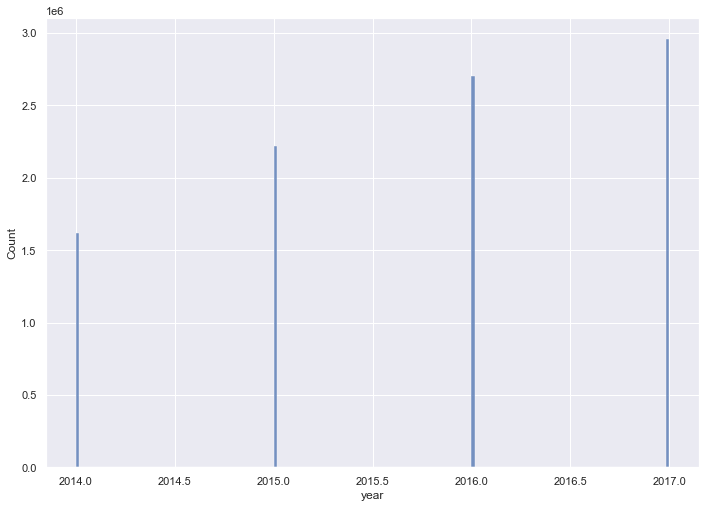

In [16]:
sns.histplot(df, x='year')

<AxesSubplot:xlabel='starttime', ylabel='Count'>

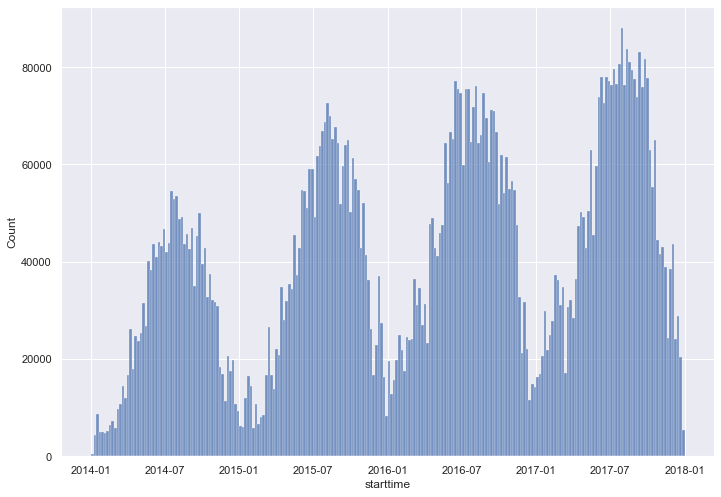

In [17]:
sns.histplot(df, x='starttime')

<AxesSubplot:xlabel='year', ylabel='Count'>

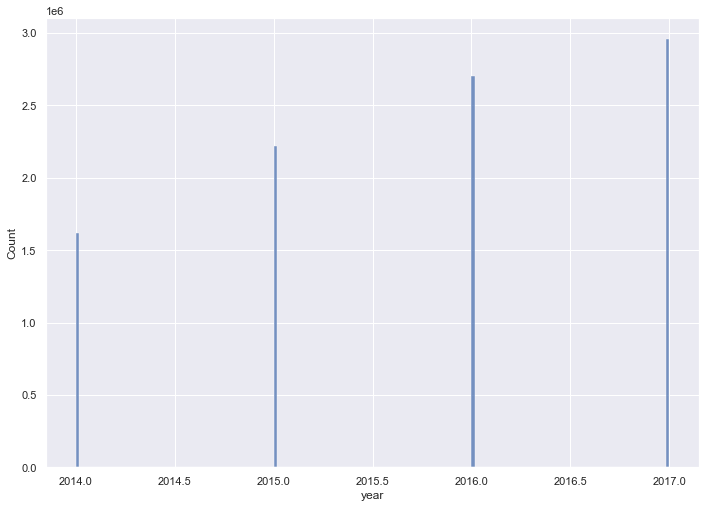

In [18]:
sns.histplot(df, x='year')

<AxesSubplot:xlabel='month', ylabel='Count'>

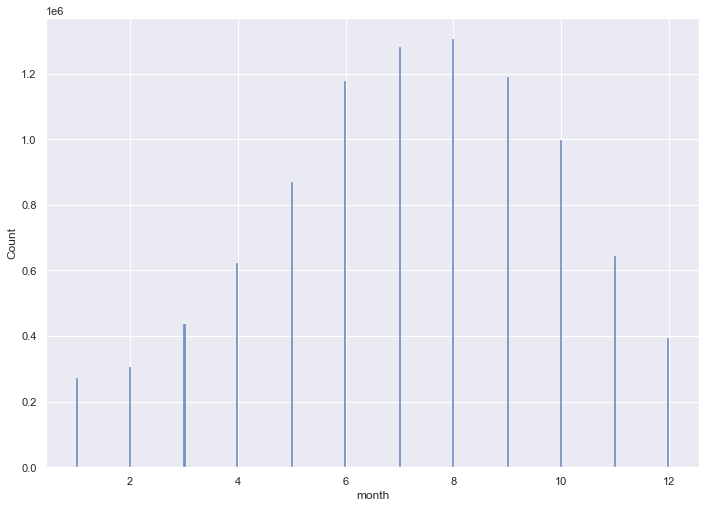

In [19]:
sns.histplot(df, x='month')

In [20]:
df.tripduration.head(10)

0    10.066667
1     4.383333
2     2.100000
3    58.016667
4    10.633333
5     5.600000
6     5.066667
7     8.750000
8     2.783333
9     4.833333
Name: tripduration, dtype: float64

In [21]:
df.events.value_counts()

cloudy          8398501
clear            511819
rain or snow     432077
not clear         88159
tstorms           64143
unknown             536
Name: events, dtype: int64

## Aggregation

In [22]:
df_group = df.groupby(['year','month','day']).aggregate({'trip_id':'count'}).reset_index()

In [23]:
df_group.set_index(['year','month'])

day  trip_id
year month              
2014 1        0     3975
     1        1     3348
     1        2     3678
     1        3     4778
     1        4     4460
...         ...      ...
2017 12       2    16329
     12       3    16831
     12       4    23513
     12       5    12296
     12       6    10527

[336 rows x 2 columns]

<AxesSubplot:>

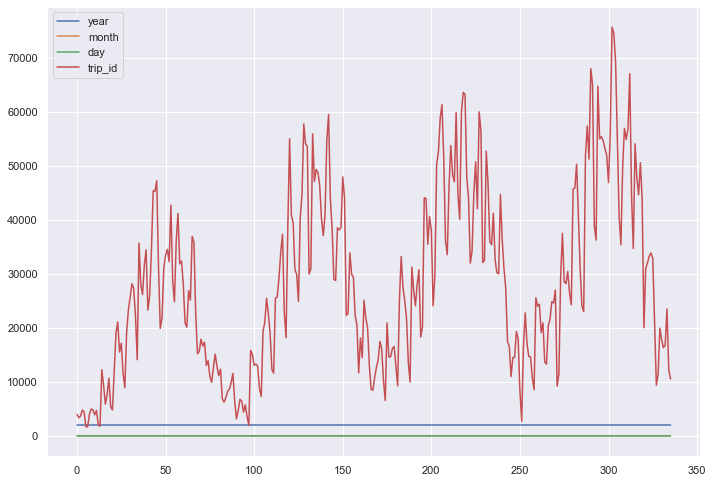

In [24]:
df_group.plot()

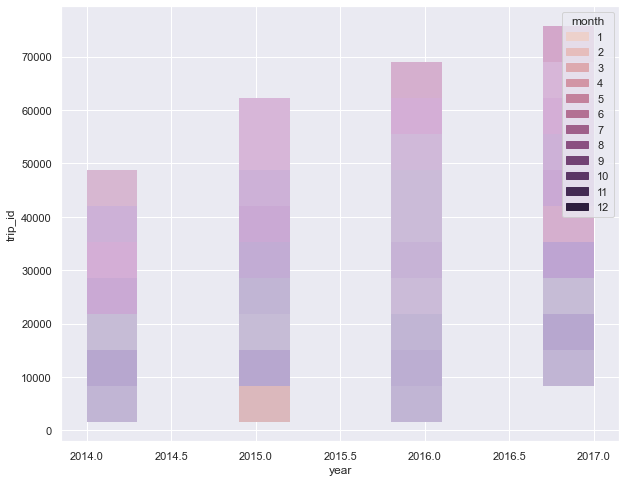

In [25]:
plt.figure(figsize=(10,8))
sns.histplot(df_group, x='year', y='trip_id', hue='month')
plt.show()

## Taking One Year in 2017

In [26]:
df_one = df[df['starttime'] > '2017-01-01 00:00:00']

In [27]:
df_one.shape

(2957690, 23)

<AxesSubplot:xlabel='starttime', ylabel='Count'>

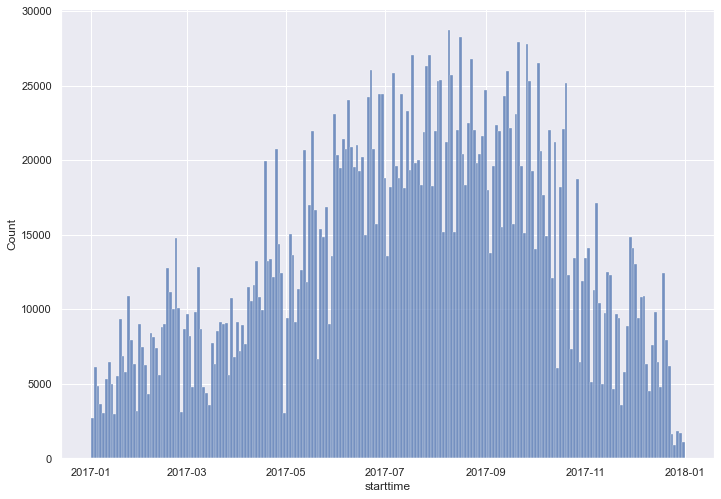

In [28]:
sns.histplot(df_one, x='starttime')

<AxesSubplot:xlabel='starttime', ylabel='Count'>

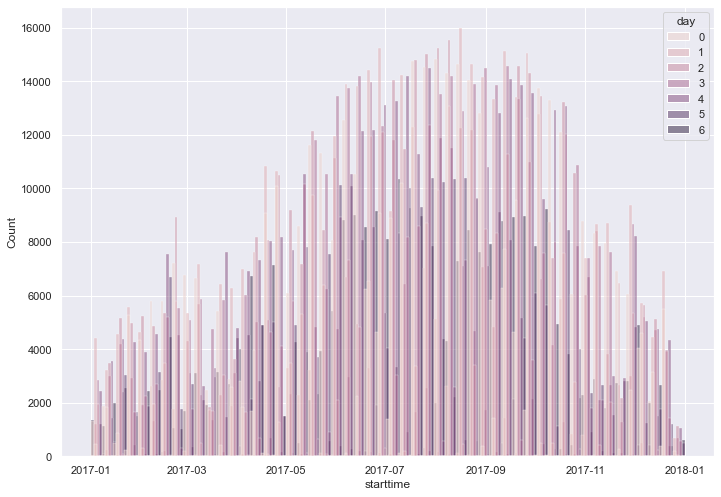

In [29]:
sns.histplot(df_one, x='starttime', hue='day')

## Analysis of summer of 2017

In [30]:
df_summer = df_one[(df_one['starttime'] > '2017-06') & (df_one['starttime'] < '2017-09')]

In [31]:
df_summer.shape

(1157765, 23)

In [32]:
df_summer.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1157765 entries, 6922904 to 8911696
Data columns (total 23 columns):
 #   Column             Non-Null Count    Dtype         
---  ------             --------------    -----         
 0   trip_id            1157765 non-null  int64         
 1   year               1157765 non-null  int64         
 2   month              1157765 non-null  int64         
 3   week               1157765 non-null  int64         
 4   day                1157765 non-null  int64         
 5   hour               1157765 non-null  int64         
 6   usertype           1157765 non-null  object        
 7   gender             1157765 non-null  object        
 8   starttime          1157765 non-null  datetime64[ns]
 9   stoptime           1157765 non-null  datetime64[ns]
 10  tripduration       1157765 non-null  float64       
 11  temperature        1157765 non-null  float64       
 12  events             1157765 non-null  object        
 13  from_station_id    11

In [33]:
df_summer.from_station_name.value_counts()

Canal St & Adams St             17497
Clinton St & Washington Blvd    16368
Clinton St & Madison St         14877
Franklin St & Monroe St         12117
Daley Center Plaza              11952
                                ...  
Damen Ave & 51st St                 2
South Chicago Ave & 83rd St         2
Normal Ave & 72nd St                1
May St & 69th St                    1
Racine Ave & 61st St                1
Name: from_station_name, Length: 588, dtype: int64

In [34]:
df_summer.to_station_name.value_counts()

Canal St & Adams St             17158
Clinton St & Madison St         15663
Clinton St & Washington Blvd    15127
Lake Shore Dr & North Blvd      14132
Kingsbury St & Kinzie St        11545
                                ...  
Commercial Ave & 83rd St            1
Evans Ave & 75th St                 1
Throop St & 52nd St                 1
Ashland Ave & 66th St               1
Cicero Ave & Flournoy St            1
Name: to_station_name, Length: 589, dtype: int64

In [40]:
#np.savetxt('datasets/bikes_summmer_2017.csv', df_summer, delimiter=',', fmt='%s')

<AxesSubplot:xlabel='tripduration', ylabel='Count'>

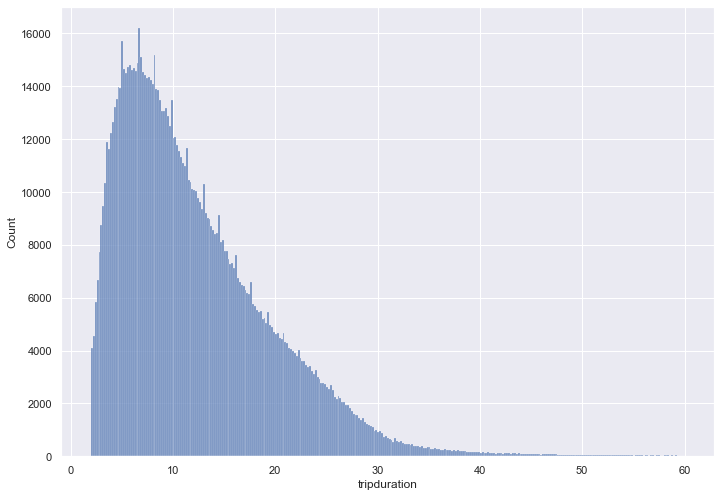

In [35]:
sns.histplot(df_summer, x='tripduration')

<AxesSubplot:xlabel='tripduration', ylabel='Count'>

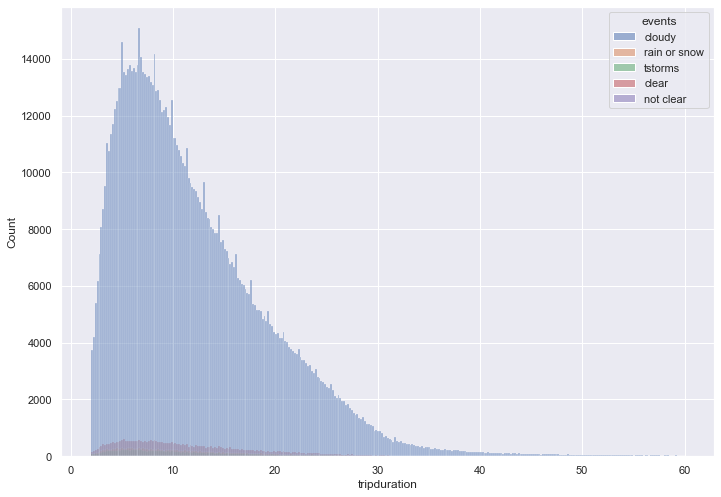

In [36]:
sns.histplot(df_summer, x='tripduration', hue='events')

## Duration

<AxesSubplot:xlabel='tripduration', ylabel='Count'>

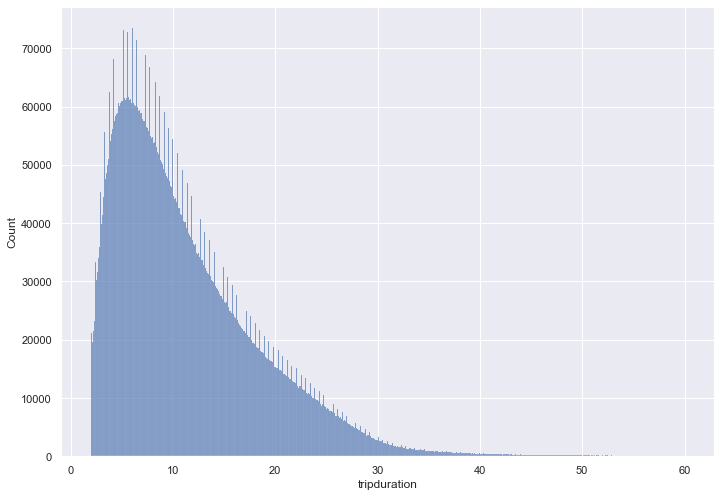

In [37]:
sns.histplot(df, x='tripduration')

<AxesSubplot:xlabel='tripduration', ylabel='Count'>

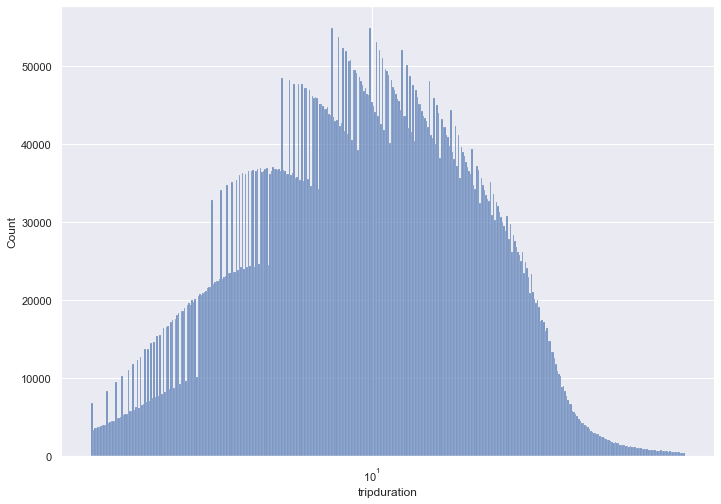

In [38]:
sns.histplot(df, x='tripduration', log_scale=True)

In [28]:
sns.boxplot(df, x='events', y='tripduration')

/Users/Sergey/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


ValueError: Could not interpret input 'tripduration'

## Percentages

In [39]:
df_perc = df_summer.groupby(['month','from_station_name','from_station_id']).aggregate({'trip_id':'count'})

In [40]:
df_perc

trip_id
month from_station_name            from_station_id         
6     2112 W Peterson Ave          456                   67
      63rd St Beach                101                   54
      900 W Harrison St            109                  523
      Aberdeen St & Jackson Blvd   21                   860
      Aberdeen St & Monroe St      80                  1144
...                                                     ...
8     Wood St & Milwaukee Ave      61                  1281
      Wood St & Taylor St          317                  826
      Woodlawn Ave & 55th St       248                  298
      Woodlawn Ave & Lake Park Ave 413                   91
      Yates Blvd & 75th St         396                    8

[1685 rows x 1 columns]

In [59]:
df_perc['sum_of_trips'] = sum(df_perc.trip_id)
df_perc = df_perc.sort_values(by=['month','trip_id'], ascending=False)
df_perc

trip_id  sum_of_trips
month from_station_name                                  
8     Canal St & Adams St              7427       1157765
      Clinton St & Washington Blvd     5970       1157765
      Clinton St & Madison St          5381       1157765
      Franklin St & Monroe St          4980       1157765
      Daley Center Plaza               4496       1157765
...                                     ...           ...
6     Exchange Ave & 79th St              1       1157765
      Throop St & 52nd St                 1       1157765
      Damen Ave & 59th St                 1       1157765
      Cottage Grove Ave & 83rd St         1       1157765
      Lawndale Ave & 23rd St              1       1157765

[1685 rows x 2 columns]

In [41]:
df_perc = df_perc.reset_index()

In [42]:
df_june = df_perc[df_perc['month'] == 6]
df_july = df_perc[df_perc['month'] == 7]
df_august = df_perc[df_perc['month'] == 8]

In [43]:
june_sum = df_june['trip_id'].sum()
df_june['sum_trips'] = june_sum
#df_july['sum_trips'] = np.sum(df_july['trip_id'])
#df_august['sum_trips'] = np.sum(df_august['trip_id'])

/var/folders/qj/yzbtrl8d3v1d1kcls_9thcs80000gn/T/ipykernel_96390/137616531.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_june['sum_trips'] = june_sum


In [44]:
july_sum = df_july['trip_id'].sum()
df_july['sum_trips'] = july_sum

/var/folders/qj/yzbtrl8d3v1d1kcls_9thcs80000gn/T/ipykernel_96390/1737167533.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_july['sum_trips'] = july_sum


In [45]:
august_sum = df_august['trip_id'].sum()
df_august['sum_trips'] = august_sum

/var/folders/qj/yzbtrl8d3v1d1kcls_9thcs80000gn/T/ipykernel_96390/3504364434.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_august['sum_trips'] = august_sum


In [46]:
df_august.head(10)

,month,from_station_name,from_station_id,trip_id,sum_trips
1122,8,2112 W Peterson Ave,456,76,406964
1123,8,63rd St Beach,101,52,406964
1124,8,900 W Harrison St,109,642,406964
1125,8,Aberdeen St & Jackson Blvd,21,1281,406964
1126,8,Aberdeen St & Monroe St,80,1367,406964
1127,8,Ada St & Washington Blvd,346,1007,406964
1128,8,Adler Planetarium,341,973,406964
1129,8,Albany Ave & 26th St,444,15,406964
1130,8,Albany Ave & Bloomingdale Ave,511,440,406964
1131,8,Albany Ave & Montrose Ave,480,139,406964


In [47]:
df_june['perc_of_trips'] = df_june['trip_id'] / df_june['sum_trips'] * 100
df_july['perc_of_trips'] = df_july['trip_id'] / df_july['sum_trips'] * 100
df_august['perc_of_trips'] = df_august['trip_id'] / df_august['sum_trips'] * 100

/var/folders/qj/yzbtrl8d3v1d1kcls_9thcs80000gn/T/ipykernel_96390/2843146636.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_june['perc_of_trips'] = df_june['trip_id'] / df_june['sum_trips'] * 100
/var/folders/qj/yzbtrl8d3v1d1kcls_9thcs80000gn/T/ipykernel_96390/2843146636.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_july['perc_of_trips'] = df_july['trip_id'] / df_july['sum_trips'] * 100
/var/folders/qj/yzbtrl8d3v1d1kcls_9thcs80000gn/T/ipykernel_96390/2843146636.py:3: SettingWithCopyWarning: 

In [122]:
df_june.sort_values(by='perc_of_trips', ascending=False)

,month,from_station_name,from_station_id,trip_id,sum_trips,perc_of_trips
135,6,Clinton St & Washington Blvd,91,5539,368841,1.501731
131,6,Clinton St & Madison St,77,4875,368841,1.321708
74,6,Canal St & Adams St,192,4737,368841,1.284293
292,6,Lake Shore Dr & North Blvd,268,3932,368841,1.066042
151,6,Daley Center Plaza,81,3760,368841,1.019409
...,...,...,...,...,...,...
501,6,Throop St & 52nd St,556,1,368841,0.000271
70,6,Calumet Ave & 71st St,393,1,368841,0.000271
152,6,Damen Ave & 59th St,561,1,368841,0.000271
481,6,State St & 76th St,572,1,368841,0.000271


## To station 

In [48]:
df_perc_to = df_summer.groupby(['month','to_station_name','to_station_id']).aggregate({'trip_id':'count'})

In [49]:
df_perc_to = df_perc_to.reset_index()

In [50]:
df_june_to = df_perc_to[df_perc_to['month'] == 6]
df_july_to = df_perc_to[df_perc_to['month'] == 7]
df_august_to = df_perc_to[df_perc_to['month'] == 8]

In [51]:
june_sum_to = df_june_to['trip_id'].sum()
df_june_to['sum_trips'] = june_sum_to
july_sum_to = df_july_to['trip_id'].sum()
df_july_to['sum_trips'] = july_sum_to
august_sum_to = df_august_to['trip_id'].sum()
df_august_to['sum_trips'] = august_sum_to

/var/folders/qj/yzbtrl8d3v1d1kcls_9thcs80000gn/T/ipykernel_96390/3161760112.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_june_to['sum_trips'] = june_sum_to
/var/folders/qj/yzbtrl8d3v1d1kcls_9thcs80000gn/T/ipykernel_96390/3161760112.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_july_to['sum_trips'] = july_sum_to
/var/folders/qj/yzbtrl8d3v1d1kcls_9thcs80000gn/T/ipykernel_96390/3161760112.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try us

In [52]:
df_june_to['perc_of_trips'] = df_june_to['trip_id'] / df_june_to['sum_trips'] * 100
df_july_to['perc_of_trips'] = df_july_to['trip_id'] / df_july_to['sum_trips'] * 100
df_august_to['perc_of_trips'] = df_august_to['trip_id'] / df_august_to['sum_trips'] * 100 

/var/folders/qj/yzbtrl8d3v1d1kcls_9thcs80000gn/T/ipykernel_96390/1331272447.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_june_to['perc_of_trips'] = df_june_to['trip_id'] / df_june_to['sum_trips'] * 100
/var/folders/qj/yzbtrl8d3v1d1kcls_9thcs80000gn/T/ipykernel_96390/1331272447.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_july_to['perc_of_trips'] = df_july_to['trip_id'] / df_july_to['sum_trips'] * 100
/var/folders/qj/yzbtrl8d3v1d1kcls_9thcs80000gn/T/ipykernel_96390/1331272447.py:3: Settin

## Getting data for December

In [133]:
df

,trip_id,year,month,week,day,hour,usertype,gender,starttime,stoptime,...,from_station_id,from_station_name,latitude_start,longitude_start,dpcapacity_start,to_station_id,to_station_name,latitude_end,longitude_end,dpcapacity_end
0,2355134,2014,6,27,0,23,Subscriber,Male,2014-06-30 23:57:00,2014-07-01 00:07:00,...,131,Lincoln Ave & Belmont Ave,41.939365,-87.668385,15.0,303,Broadway & Cornelia Ave,41.945512,-87.645980,15.0
1,2355133,2014,6,27,0,23,Subscriber,Male,2014-06-30 23:56:00,2014-07-01 00:00:00,...,282,Halsted St & Maxwell St,41.864580,-87.646930,15.0,22,May St & Taylor St,41.869482,-87.655486,15.0
2,2355130,2014,6,27,0,23,Subscriber,Male,2014-06-30 23:33:00,2014-06-30 23:35:00,...,327,Sheffield Ave & Webster Ave,41.921687,-87.653714,19.0,225,Halsted St & Dickens Ave,41.919936,-87.648830,15.0
3,2355129,2014,6,27,0,23,Subscriber,Female,2014-06-30 23:26:00,2014-07-01 00:24:00,...,134,Peoria St & Jackson Blvd,41.877749,-87.649633,19.0,194,State St & Wacker Dr,41.887155,-87.627750,11.0
4,2355128,2014,6,27,0,23,Subscriber,Female,2014-06-30 23:16:00,2014-06-30 23:26:00,...,320,Loomis St & Lexington St,41.872187,-87.661501,15.0,134,Peoria St & Jackson Blvd,41.877749,-87.649633,19.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9495230,16734072,2017,10,39,6,0,Subscriber,Female,2017-10-01 00:01:00,2017-10-01 00:12:00,...,220,Hampden Ct & Diversey Pkwy,41.932620,-87.642385,23.0,87,Racine Ave & Fullerton Ave,41.925563,-87.658404,19.0
9495231,16734071,2017,10,39,6,0,Subscriber,Male,2017-10-01 00:01:00,2017-10-01 00:12:00,...,220,Hampden Ct & Diversey Pkwy,41.932620,-87.642385,23.0,87,Racine Ave & Fullerton Ave,41.925563,-87.658404,19.0
9495232,16734070,2017,10,39,6,0,Subscriber,Male,2017-10-01 00:01:00,2017-10-01 00:15:00,...,289,Wells St & Concord Ln,41.912133,-87.634656,19.0,226,Racine Ave & Belmont Ave,41.939743,-87.658865,15.0
9495233,16734067,2017,10,39,6,0,Subscriber,Female,2017-10-01 00:00:00,2017-10-01 00:06:00,...,288,Larrabee St & Armitage Ave,41.918084,-87.643749,11.0,289,Wells St & Concord Ln,41.912133,-87.634656,19.0


In [136]:
df_december = df[(df['year'] == 2016) & (df['month'] == 12)]

In [137]:
df_december.shape #= df_one[(df_one['starttime'] > '2016-12') & (df_one['starttime'] < '2017-01')]

(88363, 23)

In [129]:
df_december

,trip_id,year,month,week,day,hour,usertype,gender,starttime,stoptime,...,from_station_id,from_station_name,latitude_start,longitude_start,dpcapacity_start,to_station_id,to_station_name,latitude_end,longitude_end,dpcapacity_end


### December from station

In [138]:
dec_perc = df_december.groupby(['month','from_station_name','from_station_id']).aggregate({'trip_id':'count'})
dec_perc = dec_perc.reset_index()
dec_sum = dec_perc['trip_id'].sum()
dec_perc['sum_trips'] = dec_sum
dec_perc['perc_of_trips'] = dec_perc['trip_id'] / dec_perc['sum_trips'] * 100


In [140]:
dec_perc

,month,from_station_name,from_station_id,trip_id,sum_trips,perc_of_trips
0,12,2112 W Peterson Ave,456,4,88363,0.004527
1,12,63rd St Beach,101,3,88363,0.003395
2,12,900 W Harrison St,109,138,88363,0.156174
3,12,Aberdeen St & Jackson Blvd,21,355,88363,0.401752
4,12,Aberdeen St & Monroe St,80,352,88363,0.398357
...,...,...,...,...,...,...
524,12,Wood St & Hubbard St,285,106,88363,0.119960
525,12,Wood St & Milwaukee Ave,61,269,88363,0.304426
526,12,Wood St & Taylor St,317,230,88363,0.260290
527,12,Woodlawn Ave & 55th St,248,68,88363,0.076955


### December to station

In [141]:
dec_perc_to = df_december.groupby(['month','to_station_name','to_station_id']).aggregate({'trip_id':'count'})
dec_perc_to = dec_perc_to.reset_index()
dec_sum_to = df_june_to['trip_id'].sum()
dec_perc_to['sum_trips'] = dec_sum_to
dec_perc_to['perc_of_trips'] = dec_perc_to['trip_id'] / dec_perc_to['sum_trips'] * 100

In [142]:
dec_perc_to

,month,to_station_name,to_station_id,trip_id,sum_trips,perc_of_trips
0,12,2112 W Peterson Ave,456,6,368841,0.001627
1,12,63rd St Beach,101,2,368841,0.000542
2,12,900 W Harrison St,109,119,368841,0.032263
3,12,Aberdeen St & Jackson Blvd,21,402,368841,0.108990
4,12,Aberdeen St & Monroe St,80,321,368841,0.087029
...,...,...,...,...,...,...
526,12,Wood St & Hubbard St,285,122,368841,0.033077
527,12,Wood St & Milwaukee Ave,61,247,368841,0.066967
528,12,Wood St & Taylor St,317,266,368841,0.072118
529,12,Woodlawn Ave & 55th St,248,59,368841,0.015996


## Getting coordinates from

In [53]:
new_smth = df_summer[['from_station_name', 'from_station_id', 'latitude_start', 'longitude_start']].drop_duplicates()

In [54]:
new_smth

,from_station_name,from_station_id,latitude_start,longitude_start
6922904,Desplaines St & Jackson Blvd,107,41.878287,-87.643909
6922905,Clark St & Grace St,165,41.950780,-87.659172
6922906,Sheffield Ave & Webster Ave,327,41.921540,-87.653818
6922907,Canal St & Adams St,192,41.879255,-87.639904
6922908,Damen Ave & Division St,130,41.903310,-87.676950
...,...,...,...,...
8268060,Halsted St & 59th St,593,41.787539,-87.644874
8300355,Damen Ave & 51st St,554,41.800908,-87.674684
8390131,Racine Ave & 61st St,562,41.783189,-87.654372
8525453,Rainbow Beach,398,41.757871,-87.549386


In [131]:
new_smth.to_csv('datasets/all_stations.csv')

### Merging for June

In [55]:
df_june_m = df_june.merge(new_smth, on='from_station_id', how='left')

In [56]:
df_june_m = df_june_m.drop_duplicates(subset=['from_station_id'])
df_june_m

,month,from_station_name_x,from_station_id,trip_id,sum_trips,perc_of_trips,from_station_name_y,latitude_start,longitude_start
0,6,2112 W Peterson Ave,456,67,368841,0.018165,2112 W Peterson Ave,41.991178,-87.683593
1,6,63rd St Beach,101,54,368841,0.014640,63rd St Beach,41.781016,-87.576120
3,6,900 W Harrison St,109,523,368841,0.141796,900 W Harrison St,41.874675,-87.650019
5,6,Aberdeen St & Jackson Blvd,21,860,368841,0.233163,Aberdeen St & Jackson Blvd,41.877726,-87.654787
6,6,Aberdeen St & Monroe St,80,1144,368841,0.310161,Aberdeen St & Monroe St,41.881567,-87.655056
...,...,...,...,...,...,...,...,...,...
741,6,Wood St & Taylor St,317,762,368841,0.206593,Wood St & Taylor St,41.869154,-87.671045
742,6,Woodlawn Ave & 55th St,248,198,368841,0.053682,Woodlawn Ave & 55th St,41.795264,-87.596471
743,6,Woodlawn Ave & 75th St,569,1,368841,0.000271,Woodlawn Ave & 75th St,41.759160,-87.595751
744,6,Woodlawn Ave & Lake Park Ave,413,78,368841,0.021147,Woodlawn Ave & Lake Park Ave,41.814093,-87.597005


In [130]:
#import os  
#os.makedirs('folder/subfolder', exist_ok=True)  
#df_june_m.to_csv('datasets/bikes_june_2017.csv')  

## Getting coordinates to

In [57]:
new_smth_to = df_summer[['to_station_name', 'to_station_id', 'latitude_end', 'longitude_end']].drop_duplicates()

## Combining the datasets from

In [108]:
df_june_m = df_june.merge(new_smth, on='from_station_', how='left')
df_july_m = df_july.merge(new_smth, on='from_station_name', how='left')
df_august_m = df_august.merge(new_smth, on='from_station_name', how='left')

In [110]:
df_june

,month,from_station_name,trip_id,sum_of_trips,sum_trips,perc_of_trips
1120,6,Clinton St & Washington Blvd,5539,1157765,368841,1.501731
1121,6,Clinton St & Madison St,4875,1157765,368841,1.321708
1122,6,Canal St & Adams St,4737,1157765,368841,1.284293
1123,6,Lake Shore Dr & North Blvd,3932,1157765,368841,1.066042
1124,6,Daley Center Plaza,3760,1157765,368841,1.019409
...,...,...,...,...,...,...
1680,6,Exchange Ave & 79th St,1,1157765,368841,0.000271
1681,6,Throop St & 52nd St,1,1157765,368841,0.000271
1682,6,Damen Ave & 59th St,1,1157765,368841,0.000271
1683,6,Cottage Grove Ave & 83rd St,1,1157765,368841,0.000271


In [109]:
df_june_m

,month,from_station_name,trip_id,sum_of_trips,sum_trips,perc_of_trips,latitude_start,longitude_start
0,6,Clinton St & Washington Blvd,5539,1157765,368841,1.501731,41.883380,-87.641170
1,6,Clinton St & Madison St,4875,1157765,368841,1.321708,41.882242,-87.641066
2,6,Canal St & Adams St,4737,1157765,368841,1.284293,41.879255,-87.639904
3,6,Lake Shore Dr & North Blvd,3932,1157765,368841,1.066042,41.911722,-87.626804
4,6,Daley Center Plaza,3760,1157765,368841,1.019409,41.884241,-87.629634
...,...,...,...,...,...,...,...,...
734,6,Throop St & 52nd St,1,1157765,368841,0.000271,41.799659,-87.657195
735,6,Damen Ave & 59th St,1,1157765,368841,0.000271,41.786020,-87.674167
736,6,Cottage Grove Ave & 83rd St,1,1157765,368841,0.000271,41.744053,-87.604786
737,6,Lawndale Ave & 23rd St,1,1157765,368841,0.000271,41.849882,-87.717000


## Combining the dataset to

### June

In [58]:
df_june_to

,month,to_station_name,to_station_id,trip_id,sum_trips,perc_of_trips
0,6,2112 W Peterson Ave,456,69,368841,0.018707
1,6,63rd St Beach,101,56,368841,0.015183
2,6,900 W Harrison St,109,441,368841,0.119564
3,6,Aberdeen St & Jackson Blvd,21,861,368841,0.233434
4,6,Aberdeen St & Monroe St,80,1113,368841,0.301756
...,...,...,...,...,...,...
559,6,Wood St & Taylor St,317,776,368841,0.210389
560,6,Woodlawn Ave & 55th St,248,208,368841,0.056393
561,6,Woodlawn Ave & 75th St,569,2,368841,0.000542
562,6,Woodlawn Ave & Lake Park Ave,413,83,368841,0.022503


In [59]:
df_june_m_to = df_june_to.merge(new_smth_to, on='to_station_id', how='left')
df_june_m_to = df_june_m_to.drop_duplicates(subset=['to_station_id'])
df_june_m_to

,month,to_station_name_x,to_station_id,trip_id,sum_trips,perc_of_trips,to_station_name_y,latitude_end,longitude_end
0,6,2112 W Peterson Ave,456,69,368841,0.018707,2112 W Peterson Ave,41.991178,-87.683593
1,6,63rd St Beach,101,56,368841,0.015183,63rd St Beach,41.781016,-87.576120
3,6,900 W Harrison St,109,441,368841,0.119564,900 W Harrison St,41.874675,-87.650019
5,6,Aberdeen St & Jackson Blvd,21,861,368841,0.233434,Aberdeen St & Jackson Blvd,41.877726,-87.654787
6,6,Aberdeen St & Monroe St,80,1113,368841,0.301756,Aberdeen St & Monroe St,41.881567,-87.655056
...,...,...,...,...,...,...,...,...,...
738,6,Wood St & Taylor St,317,776,368841,0.210389,Wood St & Taylor St,41.869154,-87.671045
739,6,Woodlawn Ave & 55th St,248,208,368841,0.056393,Woodlawn Ave & 55th St,41.795264,-87.596471
740,6,Woodlawn Ave & 75th St,569,2,368841,0.000542,Woodlawn Ave & 75th St,41.759160,-87.595751
741,6,Woodlawn Ave & Lake Park Ave,413,83,368841,0.022503,Woodlawn Ave & Lake Park Ave,41.814093,-87.597005


### August

In [115]:
df_august_to

,month,to_station_name,to_station_id,trip_id,sum_trips,perc_of_trips
1123,8,2112 W Peterson Ave,456,61,406964,0.014989
1124,8,63rd St Beach,101,52,406964,0.012778
1125,8,900 W Harrison St,109,608,406964,0.149399
1126,8,Aberdeen St & Jackson Blvd,21,1362,406964,0.334673
1127,8,Aberdeen St & Monroe St,80,1360,406964,0.334182
...,...,...,...,...,...,...
1683,8,Wood St & Taylor St,317,747,406964,0.183554
1684,8,Woodlawn Ave & 55th St,248,247,406964,0.060693
1685,8,Woodlawn Ave & 75th St,569,1,406964,0.000246
1686,8,Woodlawn Ave & Lake Park Ave,413,122,406964,0.029978


In [117]:
df_august_m = df_august.merge(new_smth, on='from_station_id', how='left')
df_august_m = df_august_m.drop_duplicates(subset=['from_station_id'])
df_august_m


,month,from_station_name_x,from_station_id,trip_id,sum_trips,perc_of_trips,from_station_name_y,latitude_start,longitude_start
0,8,2112 W Peterson Ave,456,76,406964,0.018675,2112 W Peterson Ave,41.991178,-87.683593
1,8,63rd St Beach,101,52,406964,0.012778,63rd St Beach,41.781016,-87.576120
3,8,900 W Harrison St,109,642,406964,0.157754,900 W Harrison St,41.874675,-87.650019
5,8,Aberdeen St & Jackson Blvd,21,1281,406964,0.314770,Aberdeen St & Jackson Blvd,41.877726,-87.654787
6,8,Aberdeen St & Monroe St,80,1367,406964,0.335902,Aberdeen St & Monroe St,41.881567,-87.655056
...,...,...,...,...,...,...,...,...,...
739,8,Wood St & Milwaukee Ave,61,1281,406964,0.314770,Wood St & Milwaukee Ave,41.907655,-87.672552
740,8,Wood St & Taylor St,317,826,406964,0.202966,Wood St & Taylor St,41.869154,-87.671045
741,8,Woodlawn Ave & 55th St,248,298,406964,0.073225,Woodlawn Ave & 55th St,41.795264,-87.596471
742,8,Woodlawn Ave & Lake Park Ave,413,91,406964,0.022361,Woodlawn Ave & Lake Park Ave,41.814093,-87.597005


In [118]:
df_august_m_to = df_august_to.merge(new_smth_to, on='to_station_id', how='left')
df_august_m_to = df_august_m_to.drop_duplicates(subset=['to_station_id'])
df_august_m_to

,month,to_station_name_x,to_station_id,trip_id,sum_trips,perc_of_trips,to_station_name_y,latitude_end,longitude_end
0,8,2112 W Peterson Ave,456,61,406964,0.014989,2112 W Peterson Ave,41.991178,-87.683593
1,8,63rd St Beach,101,52,406964,0.012778,63rd St Beach,41.781016,-87.576120
3,8,900 W Harrison St,109,608,406964,0.149399,900 W Harrison St,41.874675,-87.650019
5,8,Aberdeen St & Jackson Blvd,21,1362,406964,0.334673,Aberdeen St & Jackson Blvd,41.877726,-87.654787
6,8,Aberdeen St & Monroe St,80,1360,406964,0.334182,Aberdeen St & Monroe St,41.881567,-87.655056
...,...,...,...,...,...,...,...,...,...
739,8,Wood St & Taylor St,317,747,406964,0.183554,Wood St & Taylor St,41.869154,-87.671045
740,8,Woodlawn Ave & 55th St,248,247,406964,0.060693,Woodlawn Ave & 55th St,41.795264,-87.596471
741,8,Woodlawn Ave & 75th St,569,1,406964,0.000246,Woodlawn Ave & 75th St,41.759160,-87.595751
742,8,Woodlawn Ave & Lake Park Ave,413,122,406964,0.029978,Woodlawn Ave & Lake Park Ave,41.814093,-87.597005


### For December

In [143]:
dec_perc_m = dec_perc.merge(new_smth, on='from_station_id', how='left')
dec_perc_m = dec_perc_m.drop_duplicates(subset=['from_station_id'])
dec_perc_m

,month,from_station_name_x,from_station_id,trip_id,sum_trips,perc_of_trips,from_station_name_y,latitude_start,longitude_start
0,12,2112 W Peterson Ave,456,4,88363,0.004527,2112 W Peterson Ave,41.991178,-87.683593
1,12,63rd St Beach,101,3,88363,0.003395,63rd St Beach,41.781016,-87.576120
3,12,900 W Harrison St,109,138,88363,0.156174,900 W Harrison St,41.874675,-87.650019
5,12,Aberdeen St & Jackson Blvd,21,355,88363,0.401752,Aberdeen St & Jackson Blvd,41.877726,-87.654787
6,12,Aberdeen St & Monroe St,80,352,88363,0.398357,Aberdeen St & Monroe St,41.881567,-87.655056
...,...,...,...,...,...,...,...,...,...
697,12,Wood St & Hubbard St,285,106,88363,0.119960,Wood St & Hubbard St,41.889587,-87.671956
698,12,Wood St & Milwaukee Ave,61,269,88363,0.304426,Wood St & Milwaukee Ave,41.907655,-87.672552
699,12,Wood St & Taylor St,317,230,88363,0.260290,Wood St & Taylor St,41.869154,-87.671045
700,12,Woodlawn Ave & 55th St,248,68,88363,0.076955,Woodlawn Ave & 55th St,41.795264,-87.596471


In [147]:
dec_perc_m.isnull().sum()
dec_perc_m = dec_perc_m.dropna()

In [144]:
dec_perc_m_to = dec_perc_to.merge(new_smth_to, on='to_station_id', how='left')
dec_perc_m_to = dec_perc_m_to.drop_duplicates(subset=['to_station_id'])
dec_perc_m_to

,month,to_station_name_x,to_station_id,trip_id,sum_trips,perc_of_trips,to_station_name_y,latitude_end,longitude_end
0,12,2112 W Peterson Ave,456,6,368841,0.001627,2112 W Peterson Ave,41.991178,-87.683593
1,12,63rd St Beach,101,2,368841,0.000542,63rd St Beach,41.781016,-87.576120
3,12,900 W Harrison St,109,119,368841,0.032263,900 W Harrison St,41.874675,-87.650019
5,12,Aberdeen St & Jackson Blvd,21,402,368841,0.108990,Aberdeen St & Jackson Blvd,41.877726,-87.654787
6,12,Aberdeen St & Monroe St,80,321,368841,0.087029,Aberdeen St & Monroe St,41.881567,-87.655056
...,...,...,...,...,...,...,...,...,...
697,12,Wood St & Hubbard St,285,122,368841,0.033077,Wood St & Hubbard St,41.889587,-87.671956
698,12,Wood St & Milwaukee Ave,61,247,368841,0.066967,Wood St & Milwaukee Ave,41.907655,-87.672552
699,12,Wood St & Taylor St,317,266,368841,0.072118,Wood St & Taylor St,41.869154,-87.671045
700,12,Woodlawn Ave & 55th St,248,59,368841,0.015996,Woodlawn Ave & 55th St,41.795264,-87.596471


In [149]:
dec_perc_m_to.isnull().sum()
dec_perc_m_to = dec_perc_m_to.dropna()

## Mapping

### All the stations

In [60]:
loc_centre = [new_smth['latitude_start'].mean(), new_smth['longitude_start'].mean()]

map1 = folium.Map(location = loc_centre, tiles='Openstreetmap', zoom_start = 5, control_scale=True)
for index, loc in new_smth.iterrows():
    folium.CircleMarker([loc['latitude_start'], loc['longitude_start']], radius=2, weight=5, popup=loc['from_station_name']).add_to(map1)
folium.LayerControl().add_to(map1)
map1

### June 2017 from

In [61]:
from folium import plugins
from folium.plugins import HeatMap

heat_df = df_june_m.loc[:,["latitude_start","longitude_start","perc_of_trips"]]
map_hooray = folium.Map(location=loc_centre, zoom_start=12 )
#Format: list of lists as well as lat, lon and weight
heat_data = heat_df.values.tolist()
#Plot it on the map
HeatMap(heat_data,radius=13).add_to(map_hooray)
map_hooray
#heat_data

### June 2017 to 

In [62]:
heat_df_to = df_june_m_to.loc[:,["latitude_end","longitude_end","perc_of_trips"]]
map_hooray_to = folium.Map(location=loc_centre, zoom_start=12 )
#Format: list of lists as well as lat, lon and weight
heat_data1 = heat_df_to.values.tolist()
#Plot it on the map
HeatMap(heat_data1,radius=13).add_to(map_hooray_to)
map_hooray_to

## August 2017 from

In [119]:
heat_august_form = df_august_m.loc[:,["latitude_start","longitude_start","perc_of_trips"]]
map_hooray_august = folium.Map(location=loc_centre, zoom_start=12 )
#Format: list of lists as well as lat, lon and weight
heat_data_august_from = heat_august_form.values.tolist()
#Plot it on the map
HeatMap(heat_data_august_from,radius=13).add_to(map_hooray_august)
map_hooray_august
#heat_data

### August 2017 to

In [120]:
heat_august_to = df_august_m_to.loc[:,["latitude_end","longitude_end","perc_of_trips"]]
map_hooray_august_to = folium.Map(location=loc_centre, zoom_start=12 )
#Format: list of lists as well as lat, lon and weight
heat_data_august_to = heat_august_to.values.tolist()
#Plot it on the map
HeatMap(heat_data_august_to,radius=13).add_to(map_hooray_august_to)
map_hooray_august_to

### December from

In [150]:
heat_dec_form = dec_perc_m.loc[:,["latitude_start","longitude_start","perc_of_trips"]]
map_hooray_december = folium.Map(location=loc_centre, zoom_start=12 )
heat_data_dec_from = heat_dec_form.values.tolist()
HeatMap(heat_data_dec_from,radius=13).add_to(map_hooray_december)
map_hooray_december

### December to 

In [151]:
heat_dec_to = dec_perc_m_to.loc[:,["latitude_end","longitude_end","perc_of_trips"]]
map_hooray_dec_to = folium.Map(location=loc_centre, zoom_start=12 )
#Format: list of lists as well as lat, lon and weight
heat_data_dec_to = heat_dec_to.values.tolist()
#Plot it on the map
HeatMap(heat_data_dec_to,radius=13).add_to(map_hooray_dec_to)
map_hooray_dec_to

## Making the Network

In [63]:
df_summer.shape

(1157765, 23)

In [64]:
df_net = df_summer.groupby(['from_station_name', 'to_station_name']).aggregate({'trip_id':'count'})

In [65]:
df_net.head(10)

trip_id
from_station_name   to_station_name                      
2112 W Peterson Ave 2112 W Peterson Ave                 2
                    Ashland Ave & Wellington Ave        1
                    Broadway & Argyle St                1
                    Broadway & Berwyn Ave               1
                    Broadway & Granville Ave            6
                    Broadway & Ridge Ave                6
                    Broadway & Thorndale Ave            5
                    Budlong Woods Library               3
                    Clark St & Berwyn Ave              44
                    Clark St & Bryn Mawr Ave           11

In [66]:
df_net['trip_id'] = df_net['trip_id'] / 3

In [67]:
df_net = df_net.reset_index()

In [153]:
df_net_new = df_net.copy()

In [154]:
df_net_new.columns

Index(['from_station_name', 'to_station_name', 'trip_id'], dtype='object')

In [157]:
df_net_new = df_net_new.rename(columns={'from_station_name':'Source', 'to_station_name':'Target', 'trip_id':'Weight'})

In [158]:
df_net_new

,Source,Target,Weight
0,2112 W Peterson Ave,2112 W Peterson Ave,0.666667
1,2112 W Peterson Ave,Ashland Ave & Wellington Ave,0.333333
2,2112 W Peterson Ave,Broadway & Argyle St,0.333333
3,2112 W Peterson Ave,Broadway & Berwyn Ave,0.333333
4,2112 W Peterson Ave,Broadway & Granville Ave,2.000000
...,...,...,...
73938,Yates Blvd & 75th St,Shore Dr & 55th St,0.666667
73939,Yates Blvd & 75th St,South Shore Dr & 71st St,0.333333
73940,Yates Blvd & 75th St,Stony Island Ave & 71st St,0.666667
73941,Yates Blvd & 75th St,Stony Island Ave & 75th St,0.333333


In [172]:
nodes = pd.read_csv('datasets/all_stations.csv')

In [173]:
nodes['Unnamed: 0'] = nodes['from_station_id']

In [174]:
nodes = nodes.rename(columns={'Unnamed: 0':'Id','from_station_name':'Label'})

In [175]:
nodes = nodes[['Id','Label']]

In [169]:
nodes = nodes.reset_index()

In [177]:
nodes = nodes.set_index('Id')

In [178]:
nodes

,Label
Id,
107,Desplaines St & Jackson Blvd
165,Clark St & Grace St
327,Sheffield Ave & Webster Ave
192,Canal St & Adams St
130,Damen Ave & Division St
...,...
593,Halsted St & 59th St
554,Damen Ave & 51st St
562,Racine Ave & 61st St


In [179]:
nodes.to_csv('datasets/nodes.csv')

In [180]:
df_net_new.head(2)

,Source,Target,Weight
0,2112 W Peterson Ave,2112 W Peterson Ave,0.666667
1,2112 W Peterson Ave,Ashland Ave & Wellington Ave,0.333333


In [183]:
df_net_new.Weight.max()

369.3333333333333

In [181]:
df_net_new.to_csv('datasets/stations_network.csv', index=False)

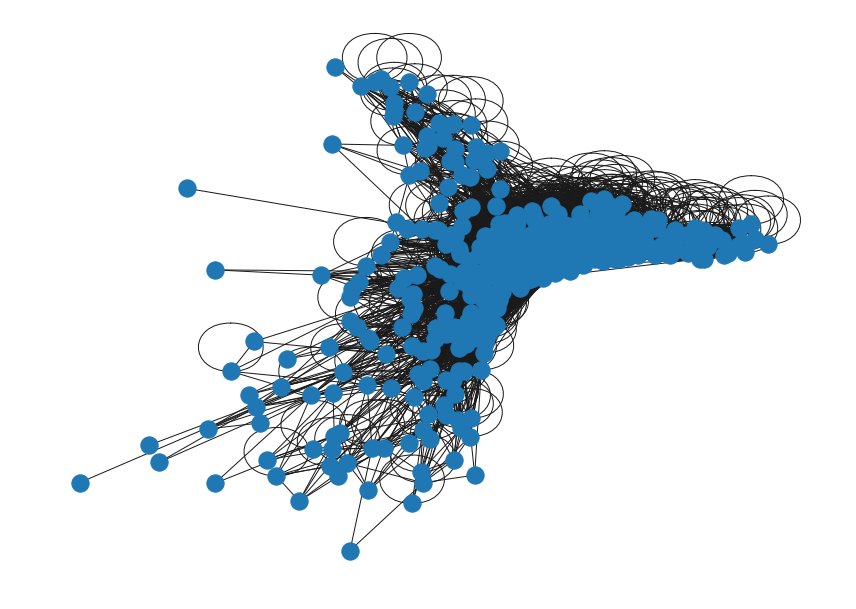

In [69]:
import networkx as nx

G = nx.from_pandas_edgelist(df_net, source='from_station_name', target='to_station_name', edge_attr='trip_id')

nx.draw(G)

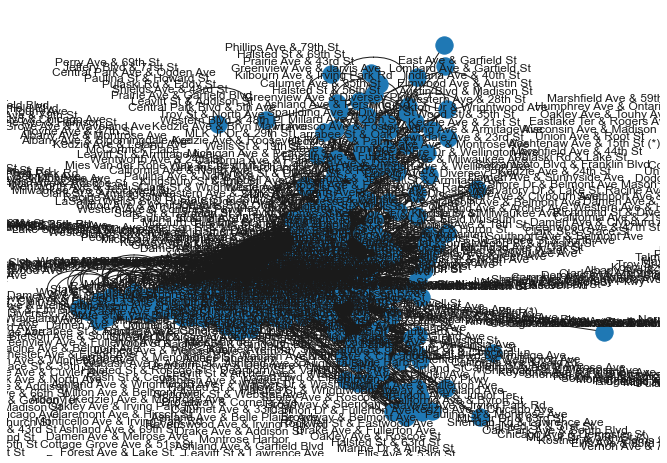

In [73]:
G = nx.from_pandas_edgelist(df_net, source='from_station_name', target='to_station_name', edge_attr='trip_id')

nx.draw_networkx_labels(G, pos=nx.spiral_layout(G))

nx.draw(G)

In [87]:
#from pyvis.network import Network

#net = Network(notebook=True)

#net.from_nx(G)

#net.show('network.html')

## Trip duration

<AxesSubplot:xlabel='tripduration', ylabel='Count'>

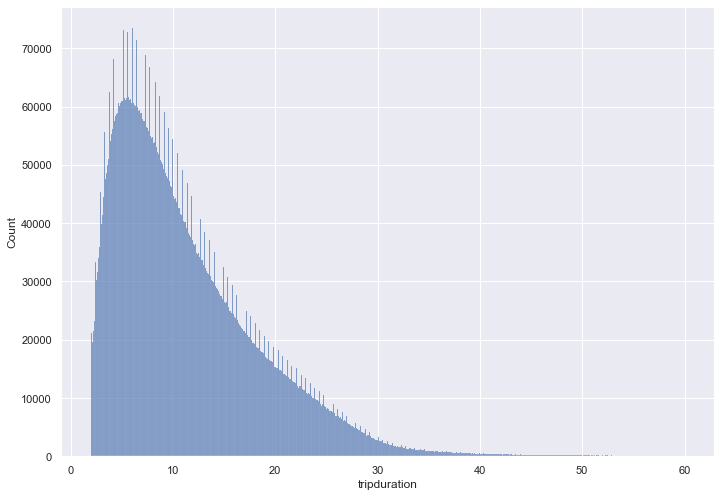

In [86]:
sns.histplot(df, x='tripduration')

<AxesSubplot:xlabel='tripduration', ylabel='Count'>

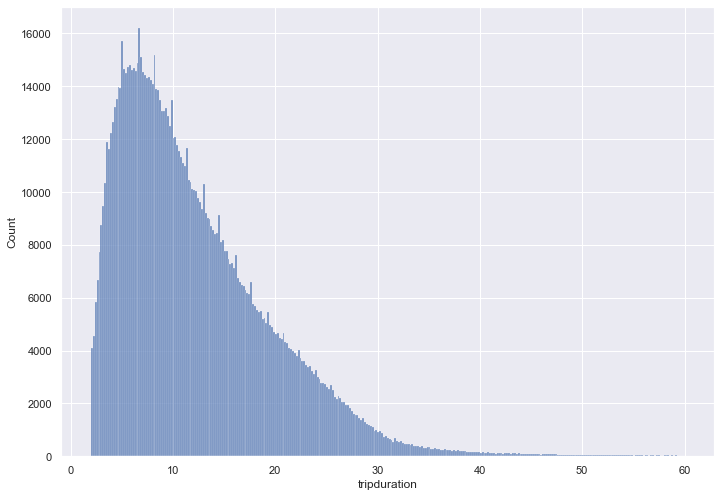

In [74]:
sns.histplot(df_summer, x='tripduration')

In [75]:
df_summer.tripduration.mean()

12.256893454197838

In [76]:
df_summer.tripduration.median()

10.483333333333333

{'whiskers': [<matplotlib.lines.Line2D at 0x7fd071ccc400>,
 'caps': [<matplotlib.lines.Line2D at 0x7fd071ccc9a0>,
 'boxes': [<matplotlib.lines.Line2D at 0x7fd071ccc130>],
 'medians': [<matplotlib.lines.Line2D at 0x7fd071cccf40>],
 'fliers': [<matplotlib.lines.Line2D at 0x7fd071cda250>],
 'means': []}

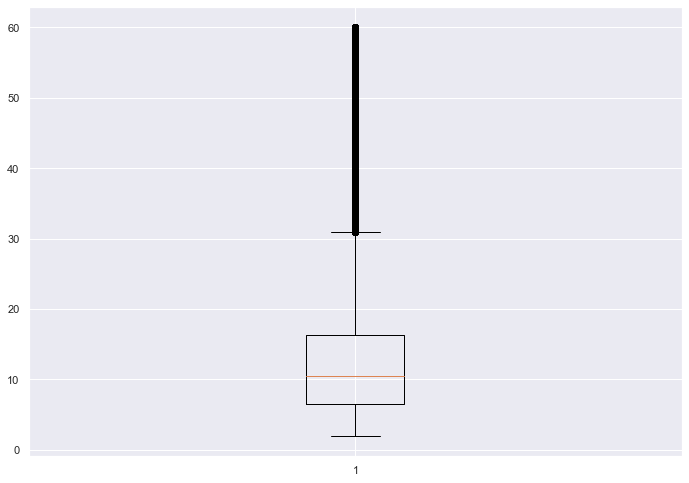

In [77]:
plt.boxplot(df_summer.tripduration)

In [82]:
trip_over_30 = df_summer[(df_summer['tripduration'] > 30) & (df_summer['month'] == 6)]

In [83]:
trip_over_30.shape

(9138, 23)

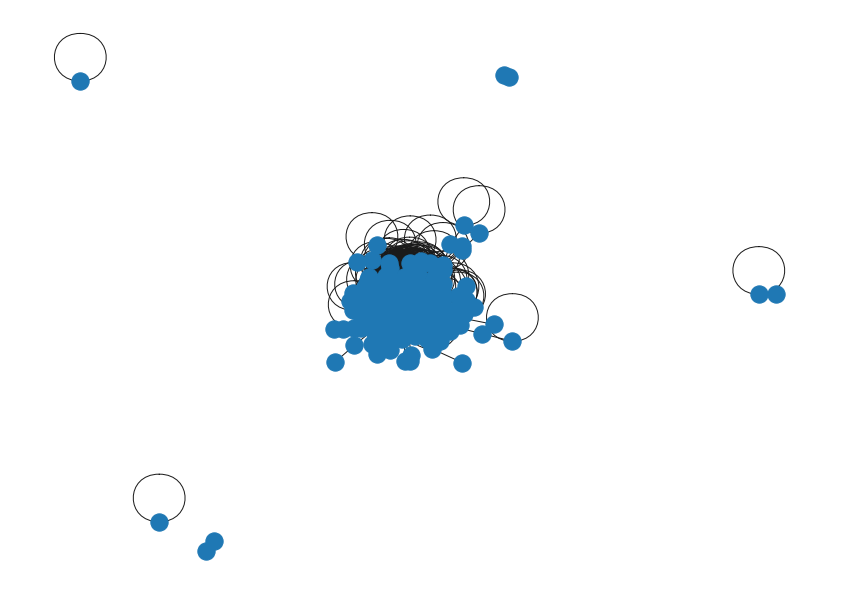

In [184]:
G2 = nx.from_pandas_edgelist(trip_over_30, source='from_station_name', target='to_station_name')

nx.draw(G2)

In [185]:
trip_over_30.head(3)

,trip_id,year,month,week,day,hour,usertype,gender,starttime,stoptime,...,from_station_id,from_station_name,latitude_start,longitude_start,dpcapacity_start,to_station_id,to_station_name,latitude_end,longitude_end,dpcapacity_end
6922996,14853066,2017,6,26,4,23,Subscriber,Female,2017-06-30 23:32:54,2017-07-01 00:07:44,...,342,Wolcott Ave & Polk St,41.871262,-87.673688,15.0,290,Kedzie Ave & Palmer Ct,41.921525,-87.707322,15.0
6923014,14853035,2017,6,26,4,23,Subscriber,Female,2017-06-30 23:27:46,2017-07-01 00:03:08,...,85,Michigan Ave & Oak St,41.900960,-87.623777,23.0,231,Sheridan Rd & Montrose Ave,41.961670,-87.654640,23.0
6923018,14853030,2017,6,26,4,23,Subscriber,Male,2017-06-30 23:27:11,2017-07-01 00:07:24,...,227,Southport Ave & Waveland Ave,41.948150,-87.663940,15.0,478,Rockwell St & Eastwood Ave,41.965900,-87.693638,15.0


In [187]:
trip_over_30_g = trip_over_30[['from_station_name','to_station_name','tripduration']]
trip_over_30_g = trip_over_30_g.rename(columns={'from_station_name':'Source','to_station_name':'Target','tripduration':'Weight'})
trip_over_30_g.to_csv('datasets/trip_over_30.csv', index=False)

In [91]:
loc_centre = [new_smth['latitude_start'].mean(), new_smth['longitude_start'].mean()]

map2 = folium.Map(location = loc_centre, tiles='Openstreetmap', zoom_start = 5, control_scale=True)
for index, loc in trip_over_30.iterrows():
    folium.CircleMarker([loc['latitude_start'], loc['longitude_start']], radius=2, weight=5, popup=loc['to_station_name']).add_to(map2)
folium.LayerControl().add_to(map2)
map2

In [92]:
trip_over_50 = trip_over_30[trip_over_30['tripduration'] > 50]

In [93]:
trip_over_50.shape

(635, 23)

In [98]:
count = 0
for index, loc in trip_over_50.iterrows():
    if loc['from_station_name'] == loc['to_station_name']:
        count += 1

print(count)

67


In [99]:
trip_over_50_clean = trip_over_50[trip_over_50['from_station_name'] != trip_over_50['to_station_name']]

In [101]:
trip_over_50_clean.shape

(568, 23)

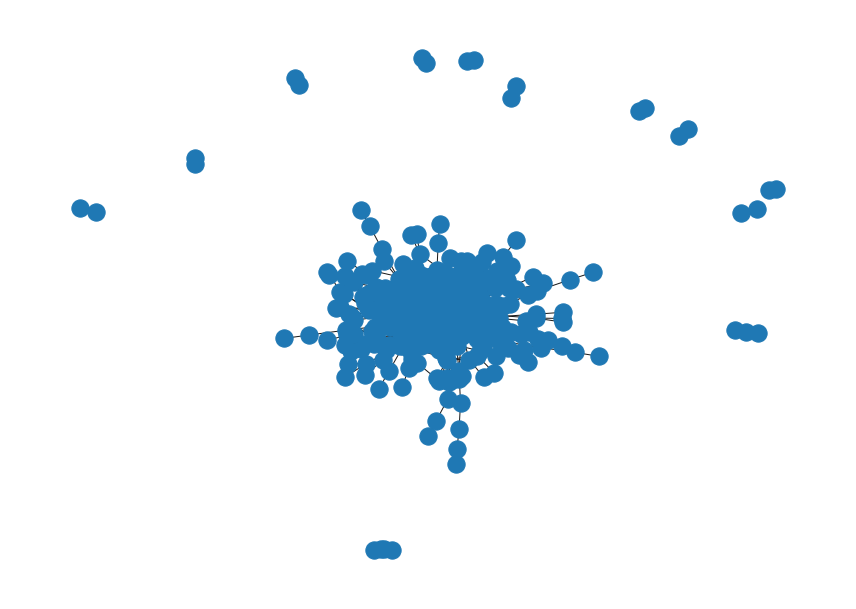

In [103]:
G3 = nx.from_pandas_edgelist(trip_over_50_clean, source='from_station_name', target='to_station_name')

nx.draw(G3)

In [102]:
loc_centre = [new_smth['latitude_start'].mean(), new_smth['longitude_start'].mean()]

map3 = folium.Map(location = loc_centre, tiles='Openstreetmap', zoom_start = 5, control_scale=True)
for index, loc in trip_over_50_clean.iterrows():
    folium.CircleMarker([loc['latitude_start'], loc['longitude_start']], radius=2, weight=5, popup=loc['from_station_name']).add_to(map3)
folium.LayerControl().add_to(map3)
map3